# Visualizing FITS Astronomy Data | Astronomy Research Data Analysis

---

#What is Image ??

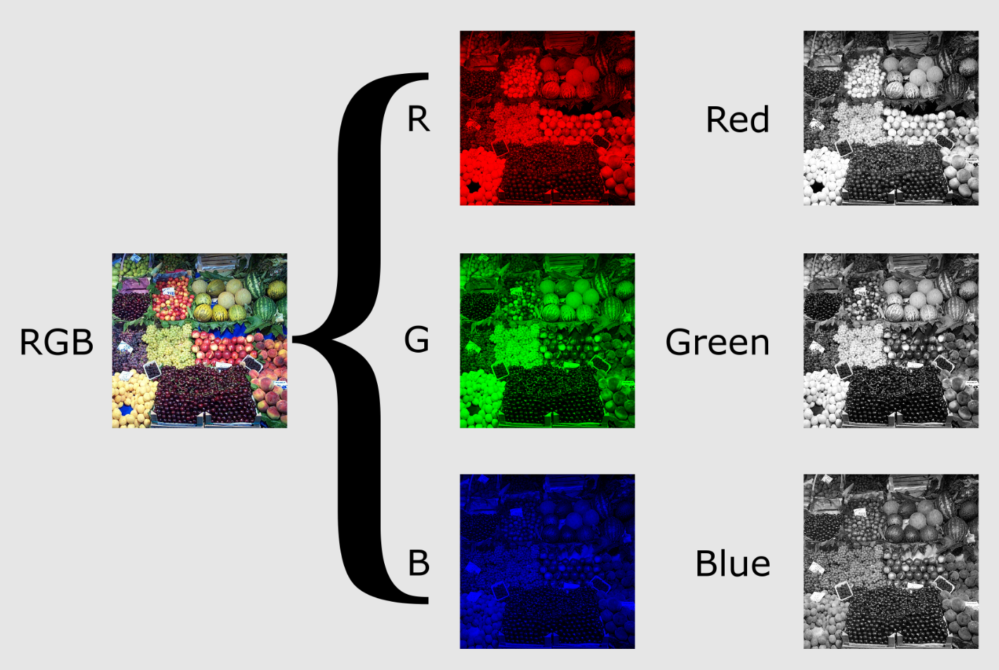

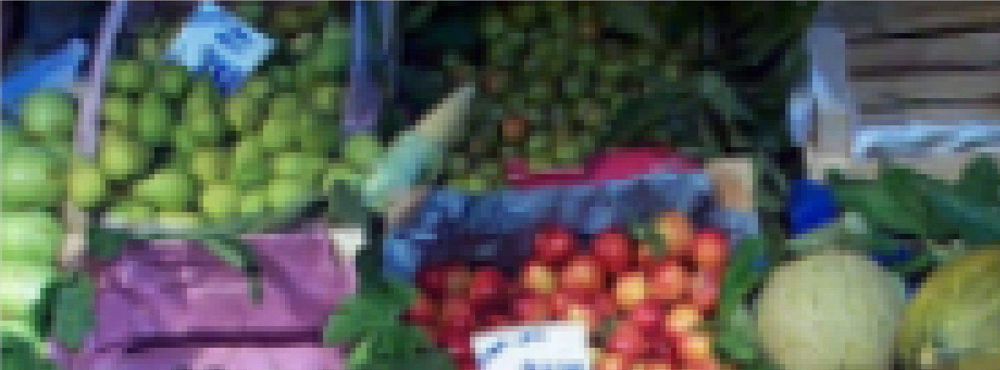

#What is FITS IMAGE ??

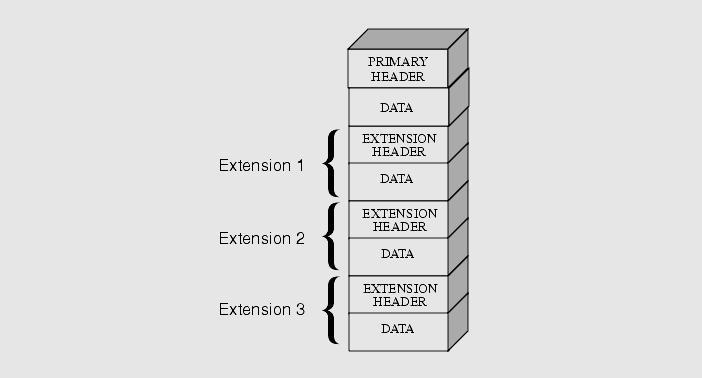

## Lets have M31 Galaxy fits Data from Astroquery

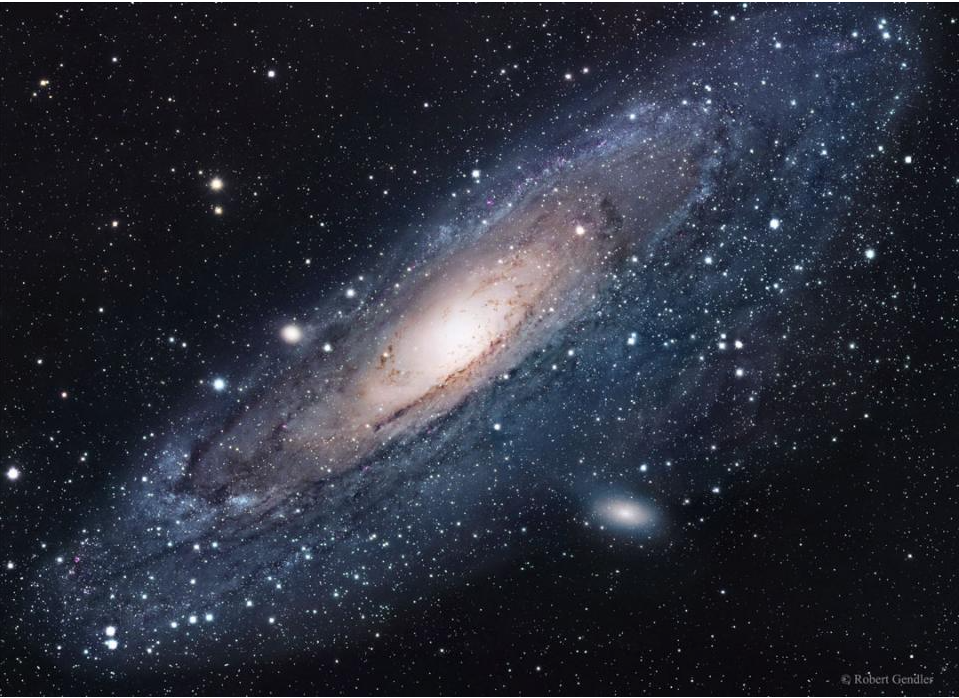

### 1) Installing Astroquery

In [1]:
!pip install astroquery

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 910.8/910.8 kB 37.2 MB/s eta 0:00:00


### 2) Import necessary Libraries and Modules

In [2]:
import matplotlib.pyplot as plt

### 3) Query for Astronomical Survey Images centered on target name

SkyView Query Form:- https://skyview.gsfc.nasa.gov/current/cgi/query.pl

<img src='http://www.messier-objects.com/wp-content/uploads/2015/04/Messier-32-Messier-31-and-Messier-110.jpg' width = 50%>

In [3]:
from astroquery.skyview import SkyView

In [4]:
# Get the Andromeda data (M31) from DSS Survey using SkyView
hdu = SkyView.get_images("M31", "DSS")[0][0]

In [5]:
hdu

### 4) Get into the data

In [6]:
# Get the Metadata using header
M31_header = hdu.header

In [7]:
# Get the pixels data from HDU
M31_Pixels = hdu.data

In [8]:
# Check the type - must be numpy array
type(M31_Pixels)

numpy.ndarray

In [9]:
# Check the shape of the array
M31_Pixels.shape

(300, 300)

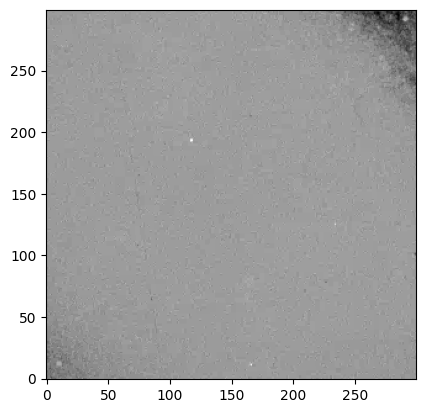

In [10]:
# Plot the image
plt.imshow(M31_Pixels, cmap='gray', origin='lower')

In [11]:
import astropy.units as u

In [12]:
hdu = SkyView.get_images("M31", "DSS2 Blue",
                         pixels=600,
                         radius=150*u.arcmin)[0][0]

In [13]:
M31_DSS2_Blue_Pixels = hdu.data

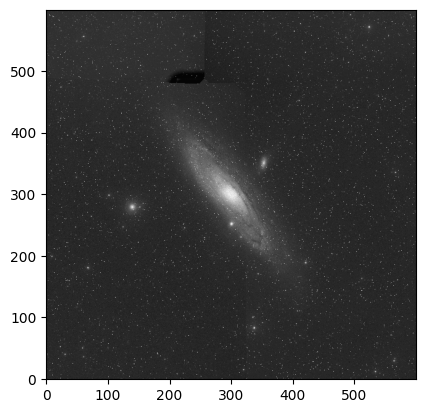

In [14]:
plt.imshow(M31_DSS2_Blue_Pixels, cmap='gray', origin='lower')

### 5) Learn to create your own FITS file

In [15]:
# Import fits from io module of astropy
from astropy.io import fits

In [16]:
'''Steps to prepare data for FITS file'''

# 1) Create HDUList() to store different HDUs
hdulist = fits.HDUList()

# 2) Create the PrimaryHDU()
hdu1 = fits.PrimaryHDU()

# 3) Add Pixels data
hdu1.data = M31_Pixels

# 4) Add Meta data
hdu1.header = M31_header

# 5) Append this Primary HDU to the HDU List
hdulist.append(hdu1)

# 6) Generate the FITS data
hdulist.writeto('Dummy_FITS_file.fits')

* Like this you can add as many HDU (different types) to create your own complete fits file!


In [17]:
# Open the FITS data generated by you!
My_fits = fits.open('/content/Dummy_FITS_file.fits')

In [18]:
# Starting by checking info
My_fits

In [19]:
# What's inside first index of our FITS data?
My_fits[0]

In [20]:
# Check the header info
My_fits[0].header

SIMPLE  =                    T / Written by SkyView Sat Sep 21 11:50:23 EDT 2024
BITPIX  =                  -32 / 4 byte floating point                          
NAXIS   =                    2 / Two dimensional image                          
NAXIS1  =                  300 / Width of image                                 
NAXIS2  =                  300 / Height of image                                
CRVAL1  =              10.6847 / Reference longitude                            
CRVAL2  =              41.2688 / Reference latitude                             
RADESYS = 'FK5     '           / Coordinate system                              
EQUINOX =               2000.0 / Epoch of the equinox                           
CTYPE1  = 'RA---TAN'           / Coordinates -- projection                      
CTYPE2  = 'DEC--TAN'           / Coordinates -- projection                      
CRPIX1  =                150.5 / X reference pixel                              
CRPIX2  =                150

In [21]:
# Check the pixels using .data
My_fits[0].data

array([[11286., 11286., 11286., ..., 11651., 11651., 11826.],
       [11111., 11111., 11461., ..., 11739., 11739., 11826.],
       [10762., 11111., 11461., ..., 11739., 11739., 11826.],
       ...,
       [11705., 11792., 11792., ..., 10362., 11061., 10537.],
       [11705., 11792., 11792., ..., 10712., 10712., 10537.],
       [11792., 11792., 11792., ..., 10188., 10537., 10712.]], dtype='>f4')

In [22]:
# Store it in a variable
dummy_data_var = My_fits[0].data

In [23]:
# Get the shape
dummy_data_var.shape

(300, 300)

In [24]:
# Get the type of the variable
type(dummy_data_var)

numpy.ndarray

##  Pixel Scaling on M31 Data

In [25]:
# Import necessary libraries to get started with Pixel Scaling
import numpy as np

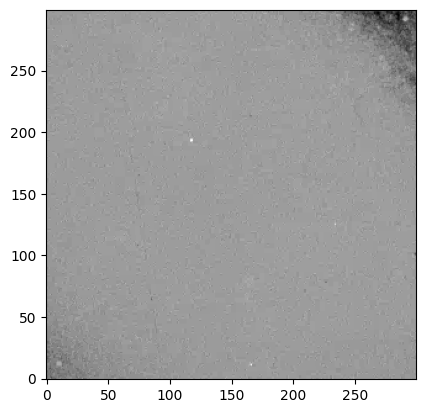

In [26]:
# Visualizing M31_Pixels once again
plt.imshow(M31_Pixels, cmap='gray', origin='lower')

In [27]:
# Printing the value of Pixel at the Center of Andromeda Galaxy
M31_Pixels[151, 151]

11835.0

In [28]:
# Check some statistic (min, max, mean, std) of the data using numpy
print('Sumarray Statistics of M31 Pixels:-')
print(f'Minimum:- {np.min(M31_Pixels)}')
print(f'Maximum:- {np.max(M31_Pixels)}')
print(f'Average:- {np.mean(M31_Pixels)}')
print(f'Std:- {np.std(M31_Pixels)}')

Sumarray Statistics of M31 Pixels:-
Minimum:- 9237.0
Maximum:- 13481.0
Average:- 11793.09375
Std:- 182.1570587158203


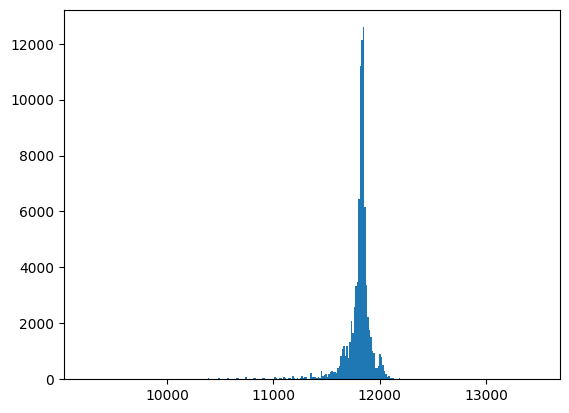

In [29]:
# Get the histogram distribution
plt.hist(M31_Pixels.flat, bins=300)
plt.show()

### 1) Intensity Normalization Or Linear Scaling Or Min Max Scaling

<img src='https://playfairdata.com/wp-content/uploads/2022/05/6.-minmax-calc.png' width=25%>

In [30]:
# A Common Function that will be used to plot the scaled pixel arrays
def plot_pixels(pixel_array, title, color):
  plt.imshow(pixel_array, cmap='gray', origin='lower')
  plt.title(title, color=color, weight='bold')
  plt.axis('off')

In [31]:
def compare_pixels(scaled_array, title):
  plt.subplot(1, 2, 1)
  plot_pixels(M31_Pixels, title='Original Image', color='black')
  plt.subplot(1, 2, 2)
  plot_pixels(scaled_array, title=title, color='royalblue')
  plt.tight_layout()
  plt.show()

In [32]:
# Define a function to normalize
def minmax_scaling(pixel_array):
  num = pixel_array - np.min(pixel_array)
  den = np.max(pixel_array) - np.min(pixel_array)
  return num/den

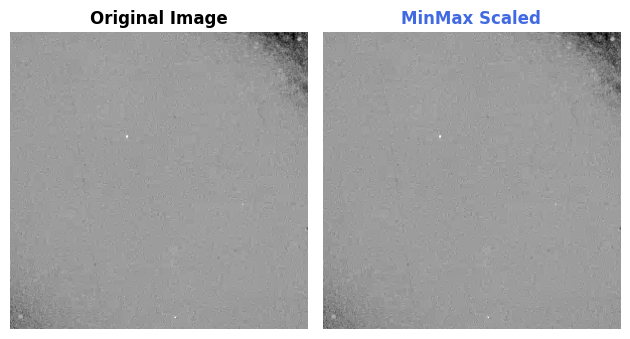

In [33]:
# Normalize the M31 data and visualize it!
minmax_array = minmax_scaling(M31_Pixels)
compare_pixels(minmax_array, title='MinMax Scaled')

### 2) Standardization Or Z scaling

<img src='https://tse2.mm.bing.net/th?id=OIP.aU-q_bfzwe1ObWyaU3CReQAAAA&pid=Api&P=0&h=180' width=15%>

In [34]:
# A function to standardize
def zscale(pixel_array):
  num = pixel_array - np.mean(pixel_array)
  den = np.std(pixel_array)
  return num/den

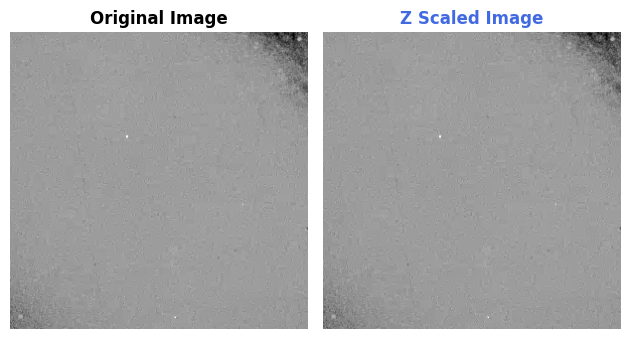

In [35]:
# Visualize the stardidize M31 data
zscaled_array = zscale(M31_Pixels)
compare_pixels(zscaled_array, title='Z Scaled Image')

### 3) Log Normalization

In [36]:
# Log Normalization is simply the log of pixels! Create a function for the same!
def log_normalization(pixel_array):
  return np.log(pixel_array)

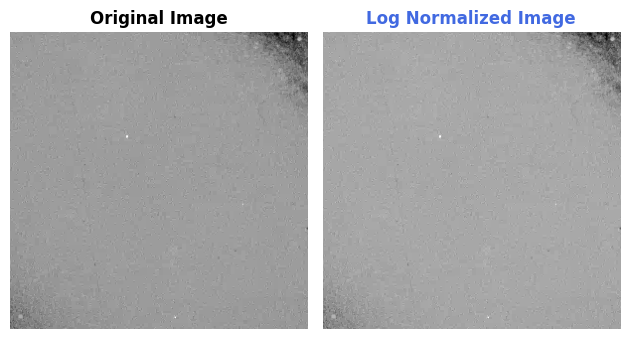

In [37]:
# Visualize the log normalization on M31 data
log_norm_array = log_normalization(M31_Pixels)
compare_pixels(log_norm_array, title='Log Normalized Image')

### 4) Create a Histogram Distribution of Pixels of the best output so far!

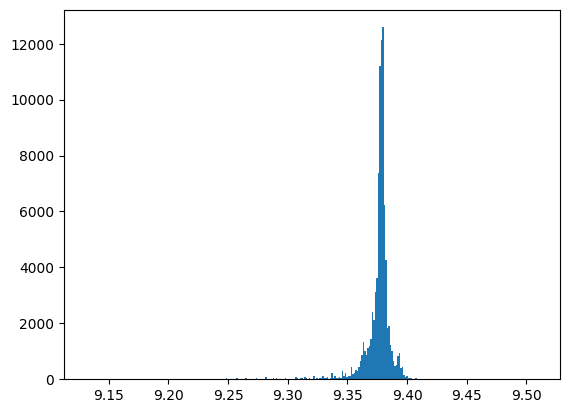

In [38]:
# Let's proceed with this log normalization!
plt.hist(log_norm_array.flat, bins=300)
plt.show()

In [39]:
# Get the shape
log_norm_array.shape

(300, 300)

## 5) Square Root


In [40]:
def sqrt_scaling(pixel_array):
  return np.sqrt(pixel_array)

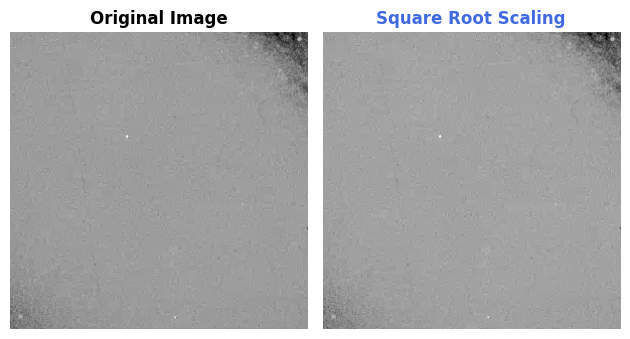

In [41]:
sqrt_array = sqrt_scaling(M31_Pixels)
compare_pixels(sqrt_array, title='Square Root Scaling')

#astropy.visualization Modules

### ZScaleInterval

In [42]:
# Get the ZScaleInterval from visualization module of astropy
from astropy.visualization import ZScaleInterval

In [43]:
# Create the object for ZScaleInterval
z = ZScaleInterval()

In [44]:
# Get min and max values of the M31 data
z1, z2 = z.get_limits(log_norm_array)

In [45]:
# Check z1 and z2
print(f'Minimum = {z1}')
print(f'Maximum = {z2}')

Minimum = 9.345743867210127
Maximum = 9.40335464477539


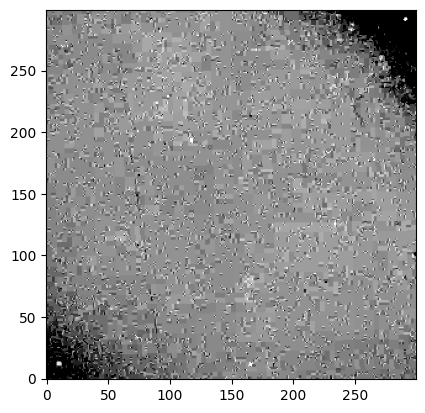

In [46]:
# Plot the M31 data using this interval
img = plt.imshow(log_norm_array, vmin=z1, vmax=z2, cmap='gray', origin='lower')
plt.show()

In [47]:
# Get the array created from the above cell
image_array = img.make_image(renderer=None, unsampled=True)[0]

In [48]:
# shape - check the channels
image_array.shape

(300, 300, 4)

**Note:-**
* Red, Green, Blue and Alpha channels makes up a 4 channel image

### Change 4 channel image to  grayscale

In [49]:
# Import cv2 library - doesn't need installation using google colab
import cv2

In [50]:
# Convert 4 channel image to grayscale image
gray_array = cv2.cvtColor(image_array, cv2.COLOR_BGRA2GRAY)

In [51]:
# Check if channels are set to 3 or 4 now
gray_array.shape

(300, 300)

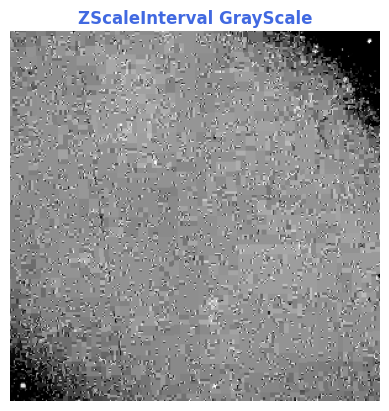

In [52]:
# Visualize it
plot_pixels(gray_array, title='ZScaleInterval GrayScale', color='royalblue')

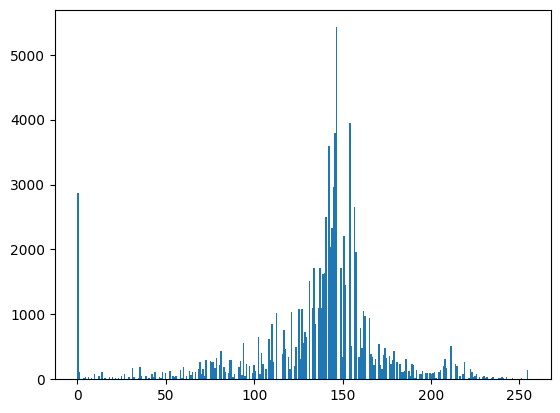

In [53]:
# Histogram Visualization
plt.hist(gray_array.flat, bins=300)
plt.show()

In [54]:
# Store grayscale in a new variable (will be using it later)
grayscale_zint_array = gray_array

It is technically Blurring the image by removing noises...Which is prerequisite to many filters and this is known as Gaussian Smoothing.

**<u>Convolution</u>:-**       
<img src='https://miro.medium.com/max/1400/1*O06nY1U7zoP4vE5AZEnxKA.gif' width=50%>

In [55]:
# We will need convolution 2D filter from Scipy's signal module
from scipy.signal import convolve2d

In [56]:
# Generate your kernel/filter
kernel = np.ones((3,3))/9

In [57]:
# Let's see how it looks
kernel

array([[0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111],
       [0.11111111, 0.11111111, 0.11111111]])

In [58]:
# Create a gaussian kernel
gaussian_kernel = np.array([[1/16, 1/8, 1/16],
                            [1/8, 1/4, 1/8],
                            [1/16, 1/8, 1/16]])

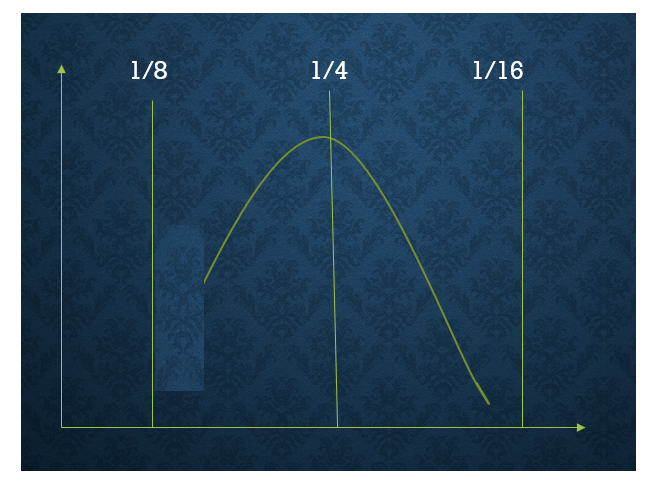

In [59]:
# Get the convolution done using our kernel
convolved_image = convolve2d(M31_Pixels, kernel, mode='same')

In [60]:
# Convolution done using gaussian kernel
gaussian_convolved_image = convolve2d(M31_Pixels, gaussian_kernel, mode='same')

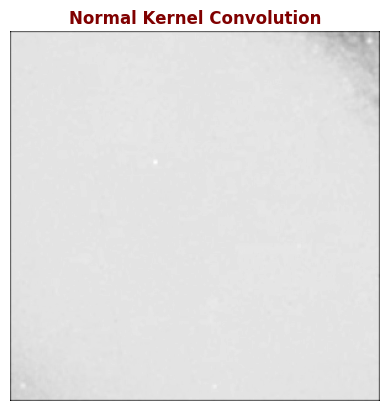

In [61]:
# Vizulaise the first kernel convolution
plot_pixels(convolved_image, title='Normal Kernel Convolution', color='maroon')

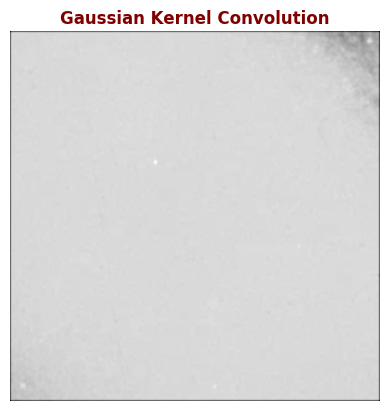

In [62]:
# Visualize the gausian kernel convolved output
plot_pixels(gaussian_convolved_image, title='Gaussian Kernel Convolution', color='maroon')

In [63]:
# Using grayscalel of M31 data to convolve with gaussian kernel
convolved_grayscale = convolve2d(grayscale_zint_array, gaussian_kernel, mode='same')

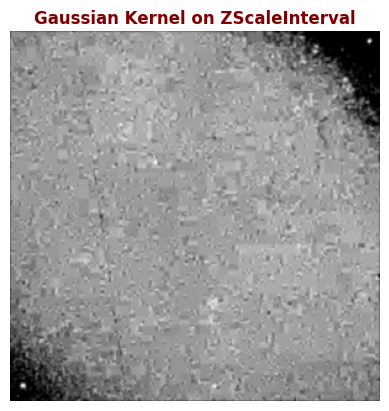

In [64]:
# Check how this looks now!
plot_pixels(convolved_grayscale, title='Gaussian Kernel on ZScaleInterval', color='maroon')

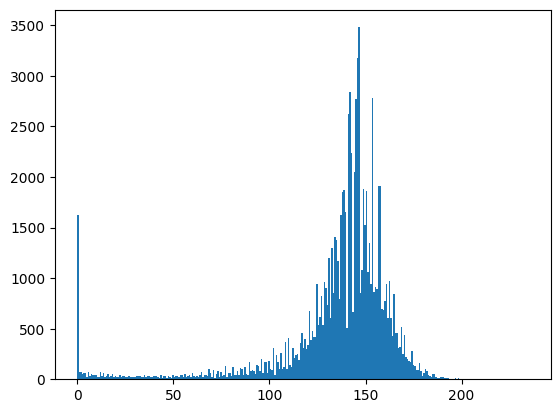

In [65]:
# Get the histogram
plt.hist(convolved_grayscale.flat, bins=300)
plt.show()

## Enhancing the Linear Features on M31
Take a look onto different available filters in skimage:-
https://scikit-image.org/docs/stable/api/skimage.filters.html

In [66]:
# Create spectral list to use later
SPECTRAL_LIST = ["gray","jet","hot","prism","nipy_spectral"]

In [67]:
# Import meijering and sato filters from skimage
from skimage.filters import meijering, sato

In [68]:
# Implement these filters on the convolved image
meijering_output = meijering(convolved_grayscale)
sato_output = sato(convolved_grayscale)

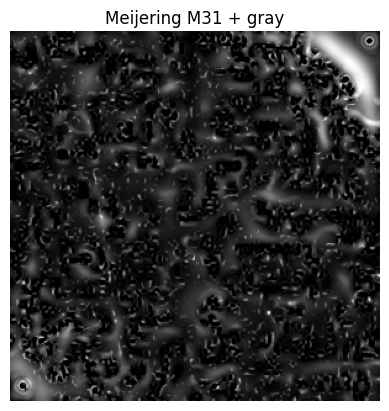

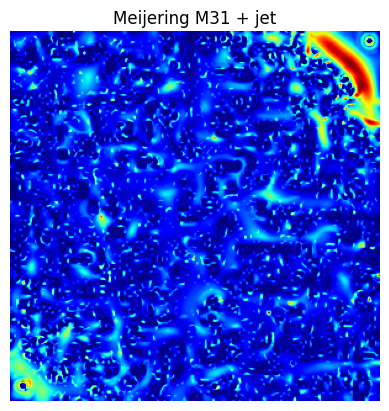

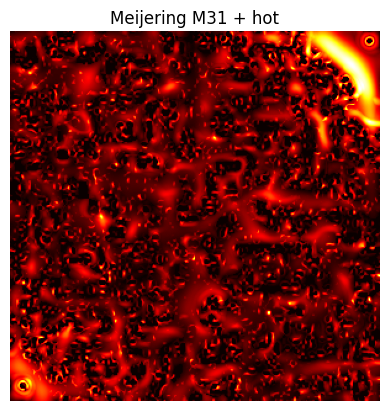

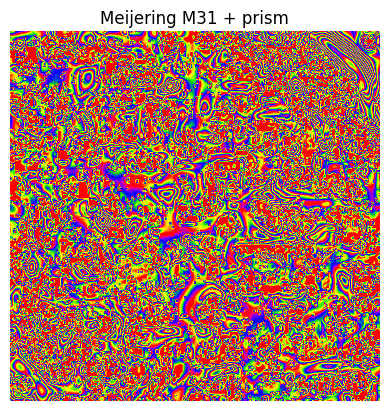

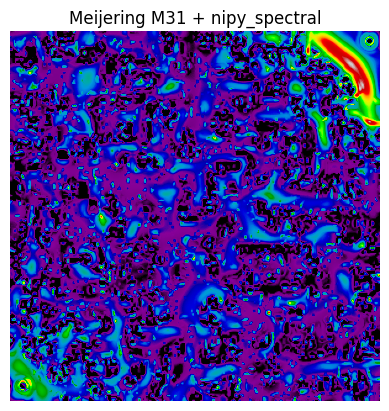

In [70]:
# For each element in the spectral list visulize the output for the meijering filter!
for colormap in SPECTRAL_LIST:
  plt.imshow(meijering_output, cmap=colormap, origin='lower')
  plt.title(f'Meijering M31 + {colormap}')
  plt.axis('off')
  plt.show()

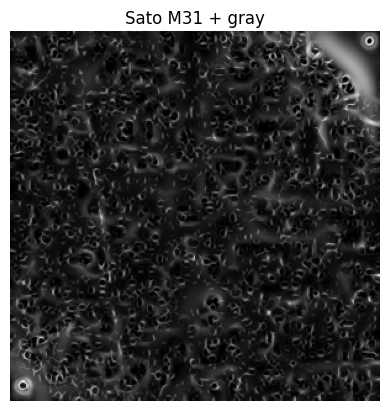

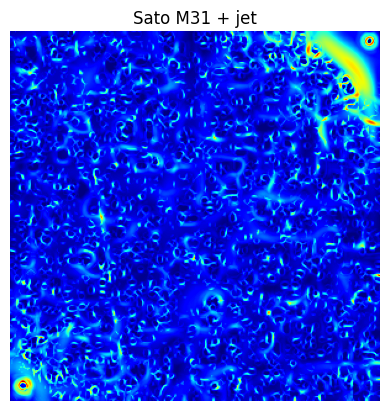

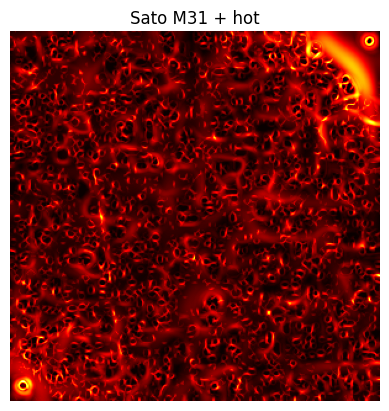

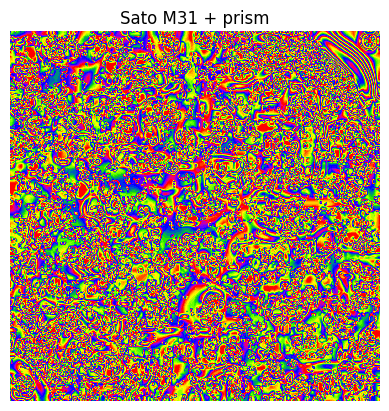

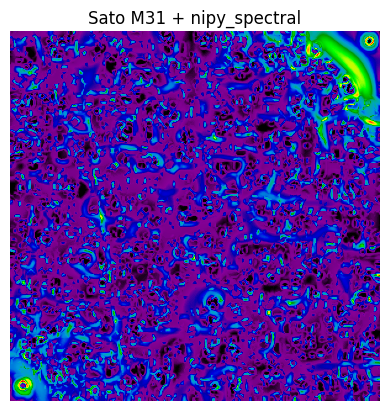

In [71]:
# For each element in the spectral list visulize the output for the sato filter!
for colormap in SPECTRAL_LIST:
  plt.imshow(sato_output, cmap=colormap, origin='lower')
  plt.title(f'Sato M31 + {colormap}')
  plt.axis('off')
  plt.show()


## Feature Detection and Extraction

skimage different features:- https://scikit-image.org/docs/stable/api/skimage.feature.html

Skimage Feature used for Feature detection and extraction, e.g., texture analysis corners, etc.

### corner_foerstner

A fast operator for detection and precise location of distinct points, corners and centres of circular features

In [72]:
# Import feature module from skimage
from skimage.feature import corner_foerstner

In [73]:
# log_scaled pixels or standard scale pixes or Normalized pixels
feature_output = corner_foerstner(convolved_grayscale)

In [74]:
# Check the output of the featured image
feature_output[1]

array([[0.63333084, 0.83533348, 0.97829723, ..., 0.1986093 , 0.63910516,
        0.77261486],
       [0.72310654, 0.90157323, 0.97759245, ..., 0.48333589, 0.94690423,
        0.77691367],
       [0.62219915, 0.77752091, 0.9309367 , ..., 0.9893206 , 0.6542695 ,
        0.33903042],
       ...,
       [0.2249665 , 0.49690321, 0.97014871, ..., 0.08842973, 0.040314  ,
        0.05274088],
       [0.64467297, 0.90084757, 0.63449019, ..., 0.07227203, 0.02062235,
        0.        ],
       [0.71090017, 0.66764726, 0.29778109, ..., 0.05274088, 0.        ,
        0.        ]])

In [75]:
# Type of the featured image
type(feature_output)

tuple

In [76]:
# Check the length of the tuple
len(feature_output)

2

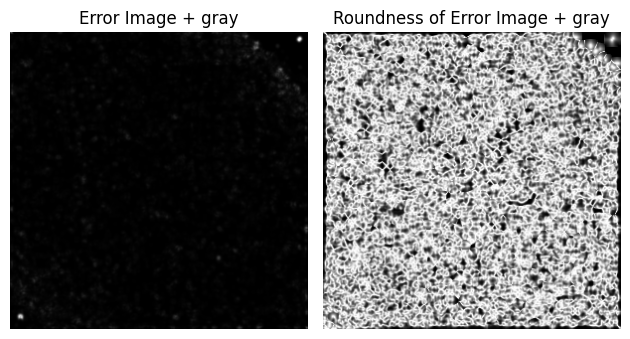

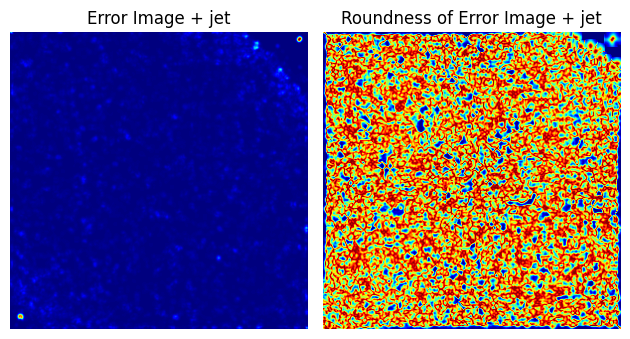

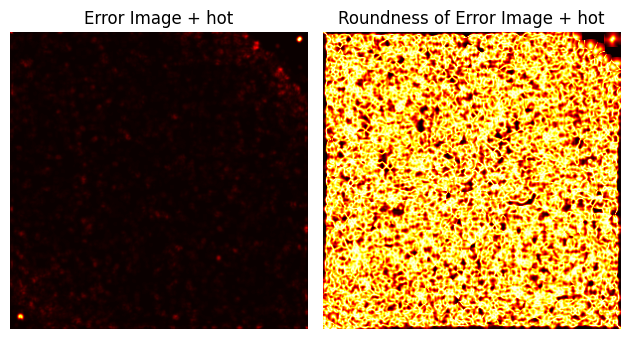

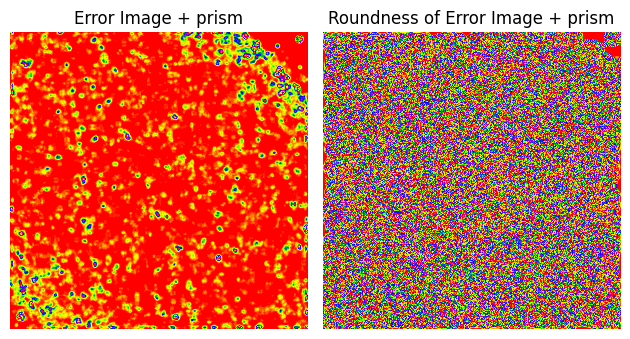

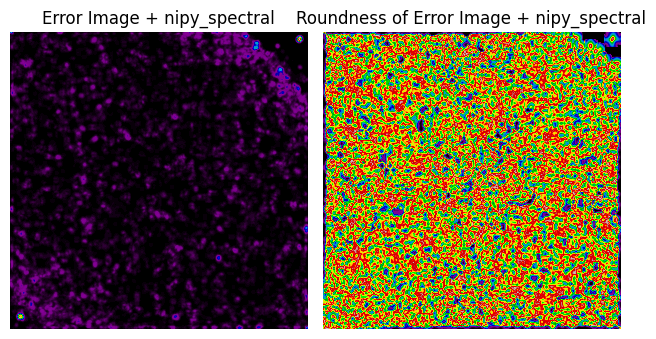

In [77]:
# Subplot Visualization
for colormap in SPECTRAL_LIST:
  plt.subplot(1, 2, 1)
  plt.imshow(feature_output[0], cmap=colormap, origin='lower')
  plt.title(f'Error Image + {colormap}')
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.imshow(feature_output[1], cmap=colormap, origin='lower')
  plt.title(f'Roundness of Error Image + {colormap}')
  plt.axis('off')

  plt.tight_layout()
  plt.show()

### multiscale_basic_features (Local Features)

In [78]:
# Import this feature
from skimage.feature import multiscale_basic_features

In [79]:
# Generate again a new featured image
featured_image = multiscale_basic_features(convolved_grayscale)

In [80]:
# Get type
type(featured_image)

numpy.ndarray

In [81]:
# Shape
featured_image.shape

(300, 300, 24)

In [82]:
# Storing each and every channel from P1 to P24
P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24 = cv2.split(featured_image)

In [83]:
# Check P1
P1.shape

(300, 300)

In [84]:
# What about last one - P24
P24.shape

(300, 300)

In [85]:
# Create list of these pixels for each channel
Pixels = [P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,P11,P12,P13,P14,P15,P16,P17,P18,P19,P20,P21,P22,P23,P24]

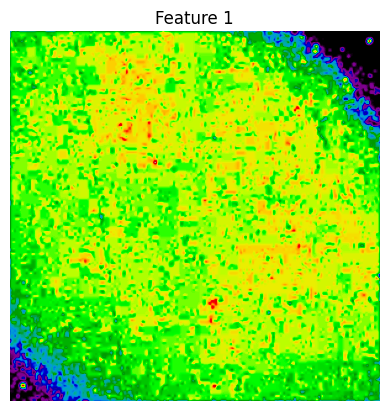

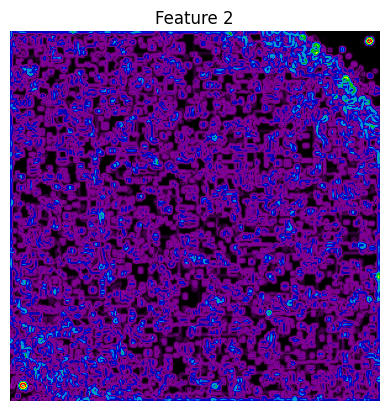

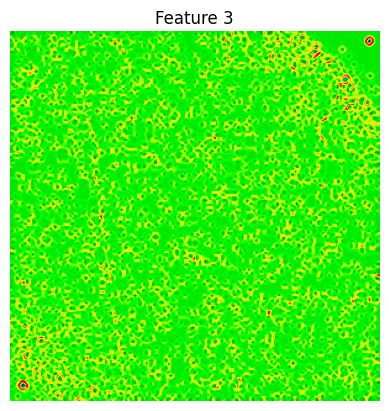

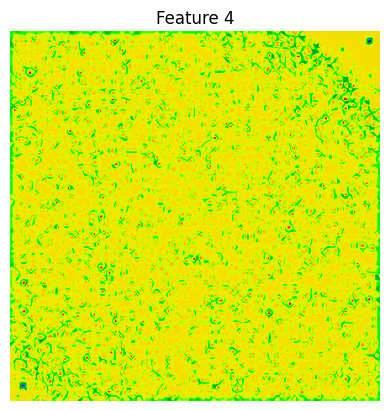

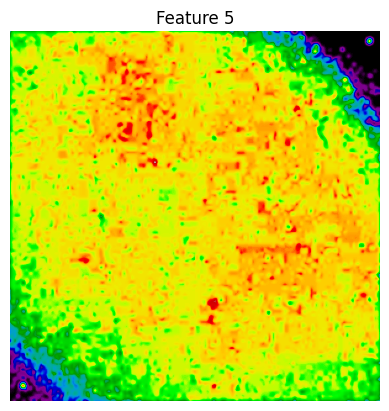

...

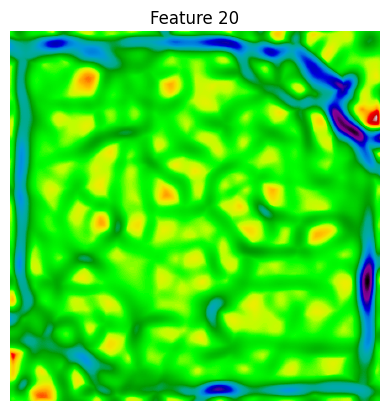

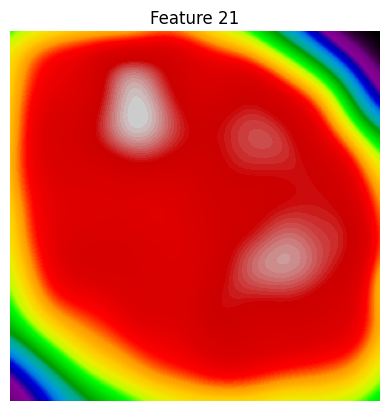

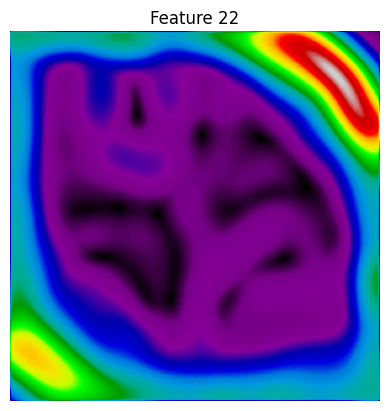

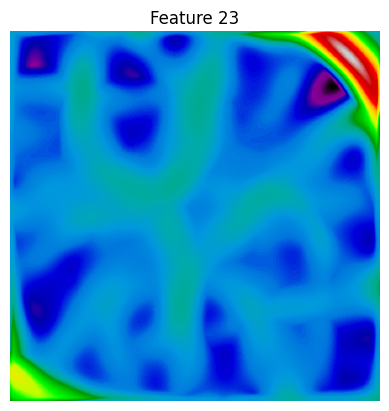

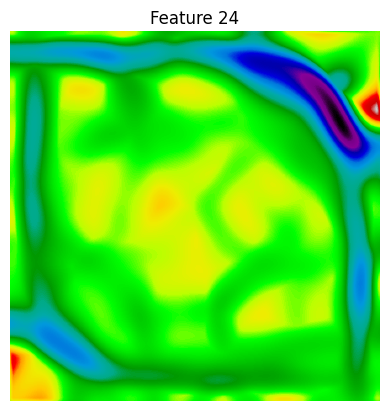

In [86]:
# Visualize each channel using prism spectral
for i, feature in enumerate(Pixels):
  plt.imshow(feature, cmap='nipy_spectral', origin='lower')
  plt.title(f'Feature {i+1}')
  plt.axis('off')
  plt.show()